## Import Dataset

In [151]:
# import required libraries

import pandas as pd
import numpy as np
import warnings
import random
import json
import glob
import re
import plotly.express as px
import plotly.io as pio
import nbformat
import lightgbm as lgb
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

from lightgbm import LGBMClassifier
from datetime import datetime 
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score as ras


%matplotlib inline
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.facecolor'] = '#00000000'

pd.options.display.max_columns=None # display all columns
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')
pio.renderers.default = 'notebook'


In [3]:
# load dataset
# import opendatasets as od

# download_url = 'https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents'
# od.download(download_url)

In [10]:
p = 0.1  # 1% of the lines
filename = '/home/gabriel/us-accidents/DataScience/App/datasets/US_Accidents_March23.csv'
# keep the header, then take only 1% of lines
# if random from [0,1] interval is greater than 0.01 the row will be skipped
df = pd.read_csv(
         filename,
         header=0, 
         skiprows=lambda i: i>0 and random.random() > p
)

## Data Understanding

### Overview the dataset
Details about features in the dataset:

#### Traffic Attributes (12):

ID: This is a unique identifier of the accident record.

Source: Indicates source of the accident report (i.e. the API which reported the accident.)

Severity: Shows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay).

Start_Time: Shows start time of the accident in local time zone.

End_Time: Shows end time of the accident in local time zone.

Start_Lat: Shows latitude in GPS coordinate of the start point.

Start_Lng: Shows longitude in GPS coordinate of the start point.

End_Lat: Shows latitude in GPS coordinate of the end point.

End_Lng: Shows longitude in GPS coordinate of the end point.

Distance(mi): The length of the road extent affected by the accident.

Description: Shows natural language description of the accident.

#### Address Attributes (9):

Number: Shows the street number in address field.

Street: Shows the street name in address field.

Side: Shows the relative side of the street (Right/Left) in address field.

City: Shows the city in address field.

County: Shows the county in address field.

State: Shows the state in address field.

Zipcode: Shows the zipcode in address field.

Country: Shows the country in address field.

Timezone: Shows timezone based on the location of the accident (eastern, central, etc.).

#### Weather Attributes (11):

Airport_Code: Denotes an airport-based weather station which is the closest one to location of the accident.

Weather_Timestamp: Shows the time-stamp of weather observation record (in local time).

Temperature(F): Shows the temperature (in Fahrenheit).

Wind_Chill(F): Shows the wind chill (in Fahrenheit).

Humidity(%): Shows the humidity (in percentage).

Pressure(in): Shows the air pressure (in inches).

Visibility(mi): Shows visibility (in miles).

Wind_Direction: Shows wind direction.

Wind_Speed(mph): Shows wind speed (in miles per hour).

Precipitation(in): Shows precipitation amount in inches, if there is any.

Weather_Condition: Shows the weather condition (rain, snow, thunderstorm, fog, etc.).

#### POI Attributes (13):

Amenity: A Point-Of-Interest (POI) annotation which indicates presence of amenity in a nearby location.

Bump: A POI annotation which indicates presence of speed bump or hump in a nearby location.

Crossing: A POI annotation which indicates presence of crossing in a nearby location.

Give_Way: A POI annotation which indicates presence of give_way sign in a nearby location.

Junction: A POI annotation which indicates presence of junction in a nearby location.

No_Exit: A POI annotation which indicates presence of no_exit sign in a nearby location.

Railway: A POI annotation which indicates presence of railway in a nearby location.

Roundabout: A POI annotation which indicates presence of roundabout in a nearby location.

Station: A POI annotation which indicates presence of station (bus, train, etc.) in a nearby location.

Stop: A POI annotation which indicates presence of stop sign in a nearby location.

Traffic_Calming: A POI annotation which indicates presence of traffic_calming means in a nearby location.

Traffic_Signal: A POI annotation which indicates presence of traffic_signal in a nearby location.

Turning_Loop: A POI annotation which indicates presence of turning_loop in a nearby location.

#### Period-of-Day (4):

Sunrise_Sunset: Shows the period of day (i.e. day or night) based on sunrise/sunset.

Civil_Twilight: Shows the period of day (i.e. day or night) based on civil twilight.

Nautical_Twilight: Shows the period of day (i.e. day or night) based on nautical twilight.

Astronomical_Twilight: Shows the period of day (i.e. day or night) based on astronomical twilight.

In [11]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.93,-82.83,NaN,NaN,0.01,Accident on Brice Rd at Tussing Rd. Expect del...,Brice Rd,Reynoldsburg,Franklin,OH,43068-3402,US,US/Eastern,KCMH,2016-02-08 05:51:00,37.90,NaN,100.00,29.65,10.00,Calm,NaN,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Day
1,A-10,Source2,3,2016-02-08 08:10:04,2016-02-08 08:40:04,40.10,-82.93,NaN,NaN,0.01,Right hand shoulder blocked due to accident on...,Westerville Rd,Westerville,Franklin,OH,43081,US,US/Eastern,KCMH,2016-02-08 08:28:00,37.40,33.80,100.00,29.62,3.00,SSW,4.60,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
2,A-20,Source2,2,2016-02-08 09:35:35,2016-02-08 10:05:35,39.79,-84.24,NaN,NaN,0.01,Accident on Hillcrest Ave at Piccadilly Ave. E...,W Hillcrest Ave,Dayton,Montgomery,OH,45406-2640,US,US/Eastern,KDAY,2016-02-08 09:56:00,36.00,30.30,89.00,29.65,10.00,West,6.90,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
3,A-24,Source2,3,2016-02-08 12:00:00,2016-02-08 12:45:00,40.02,-82.99,NaN,NaN,0.01,Accident on I-71 Northbound at Exit 113 Silver...,North Fwy S,Columbus,Franklin,OH,43211,US,US/Eastern,KCMH,2016-02-08 11:51:00,37.00,32.40,96.00,29.63,8.00,West,5.80,0.00,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day
4,A-27,Source2,2,2016-02-08 12:52:05,2016-02-08 13:37:05,39.73,-84.16,NaN,NaN,0.00,Accident on Irving Ave at Wilmington Ave.,Irving Ave,Dayton,Montgomery,OH,45419-4148,US,US/Eastern,KMGY,2016-02-08 12:53:00,36.00,29.00,86.00,29.63,7.00,West,9.20,0.00,Light Snow,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day


In [12]:
print('The shape of data is:', (df.shape))

The shape of data is: (772097, 46)


### Analyzing sources

In [13]:
df['Source'].unique()

array(['Source2', 'Source3', 'Source1'], dtype=object)

These data came from two sources. Since we are not sure whether they report severity in a similar manner, I think it is crucial to figure out the difference.

<Axes: title={'center': 'Severity count by sources'}, xlabel='Source'>

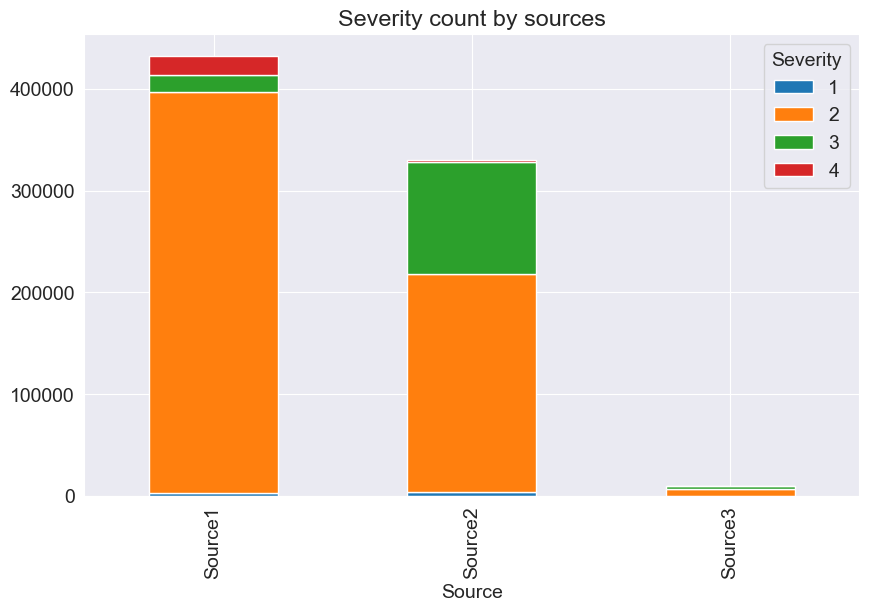

In [14]:
df_source = df.groupby(['Severity','Source']).size().reset_index().pivot(
    columns='Severity', index='Source', values=0)
df_source.plot(kind='bar', stacked=True, title='Severity count by sources')

The stacked bar chart shows that two data providers reported totally different proportions of accidents of each level. Source2 reported so rare accidents with severity level 4 which can not even be seen in the plot, whereas Source1 reported almost the same number of level 4 accidents as level 3. Meanwhile, Source2 reported much more level 3 accidents than Source1 in terms of proportion. These differences may be due to the different kinds of accidents they tend to collect or the different definitions of severity level, or the combination of them. If the latter is the case, I don't think we can use the data from both of them at the same time. To check it out, we can examine the distribution of accidents with different severity levels across two main measures, Impacted Distance and Duration.

In [15]:
# fix datetime type
df['Start_Time'] = pd.to_datetime(df['Start_Time'], format='ISO8601')
df['End_Time'] = pd.to_datetime(df['End_Time'], format='ISO8601')
df['Weather_Timestamp'] = pd.to_datetime(df['Weather_Timestamp'], format='ISO8601')

# calculate duration as the difference between end time and start time in minute
df['Duration'] = df.End_Time - df.Start_Time 
df['Duration'] = df['Duration'].apply(lambda x:round(x.total_seconds() / 60) )
print("The overall mean duration is: ", (round(df['Duration'].mean(),3)), 'min')

The overall mean duration is:  447.924 min


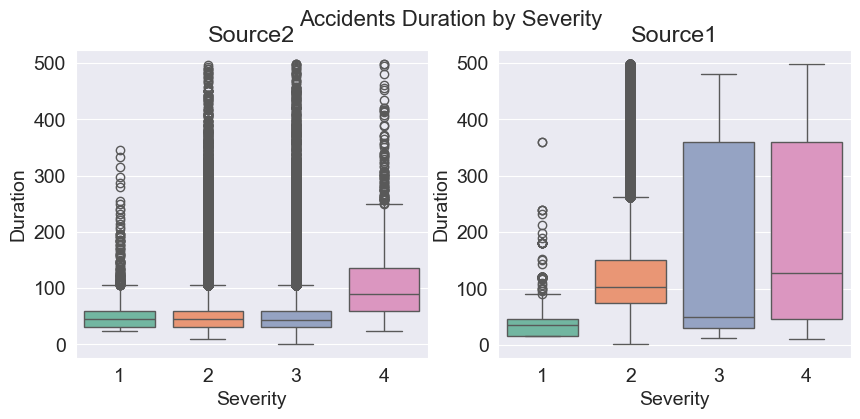

In [16]:
fig, axs = plt.subplots(ncols=2, figsize=(10, 4))
sns.boxplot(x="Severity", y="Duration",
            data=df.loc[(df['Source']=="Source2") & (df['Duration']<500),], palette="Set2", ax=axs[0])
axs[0].set_title('Source2')
fig.suptitle('Accidents Duration by Severity', fontsize=16)
sns.boxplot(x="Severity", y="Duration",
            data=df.loc[(df['Source']=="Source1") & (df['Duration']<500),], palette="Set2", ax=axs[1])
axs[1].set_title('Source1')
plt.show()

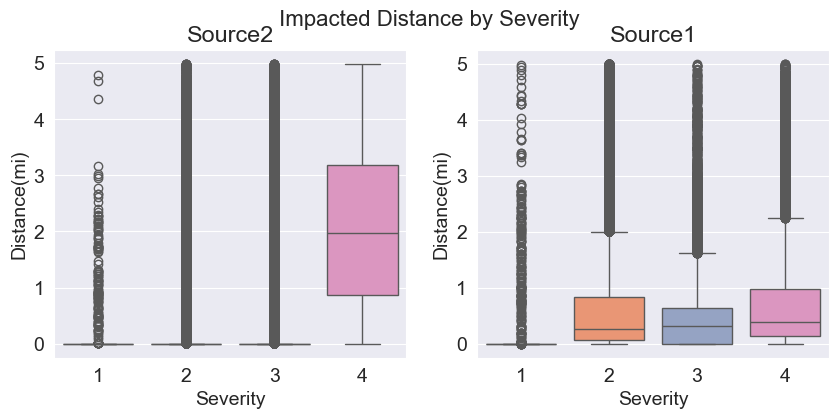

In [17]:
fig, axs = plt.subplots(ncols=2, figsize=(10, 4))
sns.boxplot(x="Severity", y="Distance(mi)", 
            data=df.loc[(df['Source']=="Source2") & (df['Distance(mi)']<5),], palette="Set2", ax=axs[0])
axs[0].set_title('Source2')
fig.suptitle('Impacted Distance by Severity', fontsize=16)
sns.boxplot(x="Severity", y="Distance(mi)",
            data=df.loc[(df['Source']=="Source1") & (df['Distance(mi)']<5),], palette="Set2", ax=axs[1])
axs[1].set_title('Source1')
plt.show()

The overall duration and impacted distance of accidents reported by Source1 are much longer than those by Source2. <br>
Second, same severity level holds different meanings for Source2 and Source1. <br>
Source2 seems to have a clear and strict threshold for severity level 4 cases of which nevertheless only account for a tiny part of the whole dataset.<br> Source1, on the other hand, doesn't seem to have a clear-cut threshold, especially regards to duration, but the data is more balanced.<br>
It is hard to choose one and we definitely can't use both. I decided to select Source2 because serious accidents are all we really care about and the sparse data of such accidents is the reality we have to confront.<br>
Finally, drop data reported from Source1 and 'Source' column.

In [18]:
df = df.loc[df['Source']=="Source2"]
df = df.drop(['Source'], axis=1)
print("The shape of data is:",(df.shape))

The shape of data is: (329999, 46)


#### Remove Useless Features

Features 'ID' doesn't provide any useful information about accidents themselves. 'Distance(mi)', 'End_Time' (we have start time), 'Duration', 'End_Lat', and 'End_Lng'(we have start location) can be collected only after the accident has already happened and hence cannot be predictors for serious accident prediction. For 'Description', the POI features have already been extracted from it by dataset creators. Let's get rid of these features first.

In [19]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Street', 'City',
       'County', 'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code',
       'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)',
       'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'Duration'],
      dtype='object')

In [20]:
df = df.drop(['ID', 'Distance(mi)', 'End_Time', 'End_Lat', 'End_Lng', 'Description'], axis=1)
df.columns

Index(['Severity', 'Start_Time', 'Start_Lat', 'Start_Lng', 'Street', 'City',
       'County', 'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code',
       'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)',
       'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'Duration'],
      dtype='object')

In [21]:
df = df.drop('Duration', axis=1)
df.columns

Index(['Severity', 'Start_Time', 'Start_Lat', 'Start_Lng', 'Street', 'City',
       'County', 'State', 'Zipcode', 'Country', 'Timezone', 'Airport_Code',
       'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)',
       'Pressure(in)', 'Visibility(mi)', 'Wind_Direction', 'Wind_Speed(mph)',
       'Precipitation(in)', 'Weather_Condition', 'Amenity', 'Bump', 'Crossing',
       'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station',
       'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

##### Categorical features

In [22]:
cat_cols = df.select_dtypes(['object', 'bool']).columns.tolist()
cat_cols

['Street',
 'City',
 'County',
 'State',
 'Zipcode',
 'Country',
 'Timezone',
 'Airport_Code',
 'Wind_Direction',
 'Weather_Condition',
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal',
 'Turning_Loop',
 'Sunrise_Sunset',
 'Civil_Twilight',
 'Nautical_Twilight',
 'Astronomical_Twilight']

In [23]:
print("Unique count of categorical features:")
for i in cat_cols:
  print(i,df[i].unique().size)

Unique count of categorical features:
Street 53667
City 7396
County 1313
State 48
Zipcode 86455
Country 1
Timezone 5
Airport_Code 1626
Wind_Direction 25
Weather_Condition 99
Amenity 2
Bump 2
Crossing 2
Give_Way 2
Junction 2
No_Exit 2
Railway 2
Roundabout 2
Station 2
Stop 2
Traffic_Calming 2
Traffic_Signal 2
Turning_Loop 1
Sunrise_Sunset 3
Civil_Twilight 3
Nautical_Twilight 3
Astronomical_Twilight 3


Drop categorical columns with only one class

In [24]:
df = df.drop(['Country', 'Turning_Loop'], axis=1)

##### Cleaning up Categorical Columns

Wind Direction

In [25]:
print('Wind Direction Categories:', df['Wind_Direction'].unique())

Wind Direction Categories: ['Calm' 'SSW' 'West' 'WNW' 'SW' 'WSW' 'NW' 'SSE' 'SE' 'North' 'NNW' 'ESE'
 'South' 'NE' 'NNE' 'East' 'ENE' 'Variable' nan 'VAR' 'CALM' 'S' 'E' 'N'
 'W']


In [26]:
df.loc[df['Wind_Direction']=='Calm','Wind_Direction'] = 'CALM'
df.loc[(df['Wind_Direction']=='West')|(df['Wind_Direction']=='WSW')|(df['Wind_Direction']=='WNW'),'Wind_Direction'] = 'W'
df.loc[(df['Wind_Direction']=='South')|(df['Wind_Direction']=='SSW')|(df['Wind_Direction']=='SSE'),'Wind_Direction'] = 'S'
df.loc[(df['Wind_Direction']=='North')|(df['Wind_Direction']=='NNW')|(df['Wind_Direction']=='NNE'),'Wind_Direction'] = 'N'
df.loc[(df['Wind_Direction']=='East')|(df['Wind_Direction']=='ESE')|(df['Wind_Direction']=='ENE'),'Wind_Direction'] = 'E'
df.loc[df['Wind_Direction']=='Variable','Wind_Direction'] = 'VAR'
print("Wind Direction after simplification: ", df['Wind_Direction'].unique())

Wind Direction after simplification:  ['CALM' 'S' 'W' 'SW' 'NW' 'SE' 'N' 'E' 'NE' 'VAR' nan]


#### Weather Condition
Weather-related vehicle accidents kill more people annually than large-scale weather disasters(source: weather.com). According to Road Weather Management Program, most weather-related crashes happen on wet-pavement and during rainfall. Winter-condition and fog are another two main reasons for weather-related accidents. To extract these three weather conditions, we first look at what we have in 'Weather_Condition' Feature

In [27]:
df['Weather_Condition'].unique()

array(['Light Rain', 'Mostly Cloudy', 'Overcast', 'Light Snow', 'Clear',
       'Scattered Clouds', 'Light Freezing Drizzle', 'Haze', 'Drizzle',
       'Partly Cloudy', nan, 'Rain', 'Heavy Rain', 'Mist', 'Fog',
       'Light Drizzle', 'Smoke', 'Fair', 'Cloudy', 'Rain Showers',
       'Light Thunderstorms and Rain', 'Showers in the Vicinity',
       'Light Rain with Thunder', 'Patches of Fog', 'Heavy Drizzle',
       'Heavy Thunderstorms and Rain', 'Shallow Fog', 'Thunderstorm',
       'Thunderstorms and Rain', 'Funnel Cloud', 'Thunder',
       'Light Freezing Fog', 'Light Freezing Rain', 'Snow',
       'Light Thunderstorms and Snow', 'Blowing Snow',
       'Light Rain Showers', 'Sand', 'Snow Grains', 'Cloudy / Windy',
       'Fair / Windy', 'Heavy Snow', 'Heavy Thunderstorms and Snow',
       'Heavy Rain / Windy', 'Light Ice Pellets', 'Ice Pellets',
       'Thunder in the Vicinity', 'Thunder / Windy', 'Heavy T-Storm',
       'T-Storm', 'Mostly Cloudy / Windy', 'Light Rain Shower',
    

In [28]:
weather = '!'.join(df['Weather_Condition'].dropna().unique().tolist())
weather

'Light Rain!Mostly Cloudy!Overcast!Light Snow!Clear!Scattered Clouds!Light Freezing Drizzle!Haze!Drizzle!Partly Cloudy!Rain!Heavy Rain!Mist!Fog!Light Drizzle!Smoke!Fair!Cloudy!Rain Showers!Light Thunderstorms and Rain!Showers in the Vicinity!Light Rain with Thunder!Patches of Fog!Heavy Drizzle!Heavy Thunderstorms and Rain!Shallow Fog!Thunderstorm!Thunderstorms and Rain!Funnel Cloud!Thunder!Light Freezing Fog!Light Freezing Rain!Snow!Light Thunderstorms and Snow!Blowing Snow!Light Rain Showers!Sand!Snow Grains!Cloudy / Windy!Fair / Windy!Heavy Snow!Heavy Thunderstorms and Snow!Heavy Rain / Windy!Light Ice Pellets!Ice Pellets!Thunder in the Vicinity!Thunder / Windy!Heavy T-Storm!T-Storm!Mostly Cloudy / Windy!Light Rain Shower!T-Storm / Windy!Partly Cloudy / Windy!Blowing Dust!Heavy T-Storm / Windy!Light Rain / Windy!Haze / Windy!N/A Precipitation!Light Snow / Windy!Wintry Mix / Windy!Rain / Windy!Light Snow and Sleet!Wintry Mix!Snow and Sleet!Heavy Snow / Windy!Blowing Snow / Windy!Snow 

In [29]:
weather = np.unique(np.array(re.split("!|\s/\s|\sand\s|\swith\s|Partly\s|Mostly\s|Blowing\s|Freezing\s|N/A\s", weather))).tolist() 
weather

['',
 'Clear',
 'Cloudy',
 'Drizzle',
 'Dust',
 'Dust Whirlwinds',
 'Fair',
 'Fog',
 'Funnel Cloud',
 'Haze',
 'Heavy ',
 'Heavy Drizzle',
 'Heavy Rain',
 'Heavy Rain Showers',
 'Heavy Sleet',
 'Heavy Snow',
 'Heavy T-Storm',
 'Heavy Thunderstorms',
 'Ice Pellets',
 'Light ',
 'Light Drizzle',
 'Light Haze',
 'Light Ice Pellets',
 'Light Rain',
 'Light Rain Shower',
 'Light Rain Showers',
 'Light Sleet',
 'Light Snow',
 'Light Snow Grains',
 'Light Snow Shower',
 'Light Snow Showers',
 'Light Thunderstorms',
 'Mist',
 'Overcast',
 'Partial Fog',
 'Patches of Fog',
 'Precipitation',
 'Rain',
 'Rain Shower',
 'Rain Showers',
 'Sand',
 'Scattered Clouds',
 'Shallow Fog',
 'Showers in the Vicinity',
 'Sleet',
 'Small Hail',
 'Smoke',
 'Snow',
 'Snow Grains',
 'Squalls',
 'T-Storm',
 'Thunder',
 'Thunder in the Vicinity',
 'Thunderstorm',
 'Thunderstorms',
 'Widespread Dust',
 'Windy',
 'Wintry Mix']

Create features for common weather conditions and drop the weather condition column

In [30]:
df['Clear'] = np.where(df['Weather_Condition'].str.contains('Clear|Fair', case=False, na = False), True, False)
df['Cloud'] = np.where(df['Weather_Condition'].str.contains('Cloud|Overcast|Funnel', case=False, na = False), True, False)
df['Rain'] = np.where(df['Weather_Condition'].str.contains('Rain|storm', case=False, na = False), True, False)
df['Heavy_Rain'] = np.where(df['Weather_Condition'].str.contains('Heavy Rain|Rain Shower|Heavy T-Storm|Heavy Thunderstorms', case=False, na = False), True, False)
df['Snow'] = np.where(df['Weather_Condition'].str.contains('Snow|Sleet|Ice', case=False, na = False), True, False)
df['Heavy_Snow'] = np.where(df['Weather_Condition'].str.contains('Heavy Snow|Heavy Sleet|Heavy Ice Pellets|Snow Showers|Squalls', case=False, na = False), True, False)
df['Fog'] = np.where(df['Weather_Condition'].str.contains('Fog|Mist', case=False, na = False), True, False)
df['Windy'] = np.where(df['Weather_Condition'].str.contains('Windy|Dust', case=False, na = False), True, False)

In [31]:
df.loc[df['Weather_Condition'].isnull(), ['Weather_Condition','Clear','Cloud','Rain','Heavy_Rain','Snow','Heavy_Snow','Fog','Windy']]

,Weather_Condition,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Windy
190,NaN,False,False,False,False,False,False,False,False
395,NaN,False,False,False,False,False,False,False,False
408,NaN,False,False,False,False,False,False,False,False
825,NaN,False,False,False,False,False,False,False,False
828,NaN,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
339535,NaN,False,False,False,False,False,False,False,False
339537,NaN,False,False,False,False,False,False,False,False
339633,NaN,False,False,False,False,False,False,False,False
339702,NaN,False,False,False,False,False,False,False,False


In [32]:
weather = ['Clear','Cloud','Rain','Heavy_Rain','Snow','Heavy_Snow','Fog', 'Windy']
for i in weather:
    df.loc[df['Weather_Condition'].isnull(),i] = np.nan
  

df.loc[:,['Weather_Condition'] + weather]



,Weather_Condition,Clear,Cloud,Rain,Heavy_Rain,Snow,Heavy_Snow,Fog,Windy
0,Light Rain,False,False,True,False,False,False,False,False
1,Light Rain,False,False,True,False,False,False,False,False
2,Mostly Cloudy,False,True,False,False,False,False,False,False
3,Overcast,False,True,False,False,False,False,False,False
4,Light Snow,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...
339761,Partly Cloudy,False,True,False,False,False,False,False,False
339762,Clear,True,False,False,False,False,False,False,False
339763,Clear,True,False,False,False,False,False,False,False
339764,Clear,True,False,False,False,False,False,False,False


In [33]:
df = df.drop(['Weather_Condition'], axis=1)

Datetime Feature Engineering

In [34]:
#average difference between weather timestamp and start time

print('Mean Difference between Weather TimeStamp and Start Time is:', (df.Weather_Timestamp - df.Start_Time).mean())

Mean Difference between Weather TimeStamp and Start Time is: 0 days 00:00:36.605733370


Since the 'Weather_Timestamp' is almost as same as 'Start_Time', we can just keep 'Start_Time'. Then map 'Start_Time' to 'Year', 'Month', 'Weekday', 'Day' (in a year), 'Hour', and 'Minute' (in a day).

In [35]:
# df = df.drop(["Weather_Timestamp"], axis=1)

df['Year'] = df['Start_Time'].dt.year

nmonth = df['Start_Time'].dt.month
df['Month'] = nmonth

df['Weekday']= df['Start_Time'].dt.weekday

df.loc[:, ['Year', 'Month', 'Weekday']]

,Year,Month,Weekday
0,2016,2,0
1,2016,2,0
2,2016,2,0
3,2016,2,0
4,2016,2,0
...,...,...,...
339761,2017,8,2
339762,2017,8,2
339763,2017,8,2
339764,2017,8,2


In [36]:
print(nmonth.values)

[2 2 2 ... 8 8 8]


In [37]:
days_each_month = np.cumsum(np.array([0,31,28,31,30,31,30,31,31,30,31,30,31]))
nday = [days_each_month[arg-1] for arg in nmonth.values]
nday = nday + df["Start_Time"].dt.day.values
df['Day'] = nday
df.loc[:4, ['Start_Time','Day']]

,Start_Time,Day
0,2016-02-08 06:07:59,39
1,2016-02-08 08:10:04,39
2,2016-02-08 09:35:35,39
3,2016-02-08 12:00:00,39
4,2016-02-08 12:52:05,39


In [38]:
df['Hour'] = df['Start_Time'].dt.hour

df['Minute']=df['Hour']*60.0+df["Start_Time"].dt.minute

df.loc[:4,['Start_Time', 'Year', 'Month', 'Weekday', 'Day', 'Hour', 'Minute']]

,Start_Time,Year,Month,Weekday,Day,Hour,Minute
0,2016-02-08 06:07:59,2016,2,0,39,6,367.00
1,2016-02-08 08:10:04,2016,2,0,39,8,490.00
2,2016-02-08 09:35:35,2016,2,0,39,9,575.00
3,2016-02-08 12:00:00,2016,2,0,39,12,720.00
4,2016-02-08 12:52:05,2016,2,0,39,12,772.00


### Handling Missing Values

In [39]:
#check percentage of missing values

missing = pd.DataFrame(df.isnull().sum()).reset_index()
missing.columns = ['Feature', 'Missing_Percent(%)']
missing['Missing_Percent(%)'] = missing['Missing_Percent(%)'].apply(lambda x: x / df.shape[0] * 100)
missing.loc[missing['Missing_Percent(%)']>0,:].sort_values(by=['Missing_Percent(%)'], ascending = False)

,Feature,Missing_Percent(%)
19,Precipitation(in),46.95
13,Wind_Chill(F),43.57
18,Wind_Speed(mph),10.74
16,Visibility(mi),1.94
36,Clear,1.92
39,Heavy_Rain,1.92
40,Snow,1.92
37,Cloud,1.92
38,Rain,1.92
42,Fog,1.92


We see that almost 50% of Wind Chill And Precipitation is missing.
Since research shows that Windchill is not that related to the severity of the accident, we are going to drop it.

In [40]:
df = df.drop('Wind_Chill(F)', axis=1)

Since Precipitation could be a determinant for the severity, we are going to replace the missing values by the median.

In [41]:
df['Precipitation(in)'].median()

np.float64(0.0)

In [42]:
df['Precipitation(in)'] = df['Precipitation(in)'].fillna(df['Precipitation(in)'].median())
df.loc[:5, 'Precipitation(in)']

0   0.00
1   0.02
2   0.00
3   0.00
4   0.00
5   0.00
Name: Precipitation(in), dtype: float64

In [43]:
df = df.dropna(subset=['City','Zipcode','Airport_Code',
                       'Sunrise_Sunset','Civil_Twilight','Nautical_Twilight','Astronomical_Twilight'])

#### Continuous Weather Data
Continuous weather features with missing values:

Temperature(F)

Humidity(%)

Pressure(in)

Visibility(mi)

Wind_Speed(mph)

Before imputation, weather features will be grouped by location and time first, to which weather is naturally related. 'Airport_Code' is selected as location feature because the sources of weather data are airport-based weather stations. Then the data will be grouped by 'Start_Month' rather than 'Start_Hour' because using the former is computationally cheaper and remains less missing values. Finally, missing values will be replaced by median value of each group.

In [44]:
Weather_data=['Temperature(F)','Humidity(%)','Pressure(in)','Visibility(mi)','Wind_Speed(mph)']
print("The number of remaining missing values: ")
for i in Weather_data:
  df[i] = df.groupby(['Airport_Code','Month'])[i].transform(lambda x: x.fillna(x.median()))
  print( i + " : " + df[i].isnull().sum().astype(str))

The number of remaining missing values: 
Temperature(F) : 773
Humidity(%) : 784
Pressure(in) : 753
Visibility(mi) : 1643
Wind_Speed(mph) : 1809


Drop the remaining missing values

In [45]:
df = df.dropna(subset=Weather_data)

#### Categorical Weather data

For categorical weather features, majority rather than median will be used to replace missing values.

In [46]:
# group data by 'Airport_Code' and 'Start_Month' then fill NAs with majority value
from collections import Counter


weather_cat = ['Wind_Direction'] + weather
print("Count of missing values that will be dropped: ")
for i in weather_cat:
  df[i] = df.groupby(['Airport_Code','Month'])[i].transform(lambda x: x.fillna(Counter(x).most_common()[0][0]) if all(x.isnull())==False else x)
  print(i + " : " + df[i].isnull().sum().astype(str))

# drop na
df.dropna(subset=weather_cat, inplace=True)


Count of missing values that will be dropped: 
Wind_Direction : 985
Clear : 1143
Cloud : 1047
Rain : 770
Heavy_Rain : 683
Snow : 684
Heavy_Snow : 685
Fog : 696
Windy : 698


In [47]:
df.dropna(inplace=True)

In [48]:
df.isnull().sum()

Severity                 0
Start_Time               0
Start_Lat                0
Start_Lng                0
Street                   0
City                     0
County                   0
State                    0
Zipcode                  0
Timezone                 0
Airport_Code             0
Weather_Timestamp        0
Temperature(F)           0
Humidity(%)              0
Pressure(in)             0
Visibility(mi)           0
Wind_Direction           0
Wind_Speed(mph)          0
Precipitation(in)        0
Amenity                  0
Bump                     0
Crossing                 0
Give_Way                 0
Junction                 0
No_Exit                  0
Railway                  0
Roundabout               0
Station                  0
Stop                     0
Traffic_Calming          0
Traffic_Signal           0
Sunrise_Sunset           0
Civil_Twilight           0
Nautical_Twilight        0
Astronomical_Twilight    0
Clear                    0
Cloud                    0
R

### Exploration and Engineering

In [49]:
# check value counts for Severity

df['Severity'].value_counts()

Severity
2    211767
3    107634
1      3466
4      1366
Name: count, dtype: int64

#### Resampling 
Since our main focus is distinguishing accidents with high severity from those with low severity, coupled with the fact that the the division between these Severity levels is far from clear-cut, I decided to regroup the levels of severity into level high(3,4) versus low(1,2).

In [50]:
df['High_Severity'] = (df['Severity'].isin([4,3])).astype(int)
print('Count of high severity accidents is : ', df.High_Severity.value_counts())

Count of high severity accidents is :  High_Severity
0    215233
1    109000
Name: count, dtype: int64


In [51]:
df.loc[(df['Severity'].isin([4, 3])), ['High_Severity']]

,High_Severity
1,1
3,1
7,1
11,1
12,1
...,...
339754,1
339756,1
339760,1
339761,1


As seen from above, the data is kind of unbalanced. We need to be balance it out so as to get accurate exploratory analysis. To address this issue, the combination of over- and under-sampling will be used since the dataset is large enough.

In [52]:

cat_cols = df.select_dtypes(['object', 'bool','datetime64[ns]' ]).columns.tolist()
cat_cols

['Start_Time',
 'Street',
 'City',
 'County',
 'State',
 'Zipcode',
 'Timezone',
 'Airport_Code',
 'Weather_Timestamp',
 'Wind_Direction',
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal',
 'Sunrise_Sunset',
 'Civil_Twilight',
 'Nautical_Twilight',
 'Astronomical_Twilight',
 'Clear',
 'Cloud',
 'Rain',
 'Heavy_Rain',
 'Snow',
 'Heavy_Snow',
 'Fog',
 'Windy']

In [53]:
def resample(dat, col, n):
    return pd.concat([dat[dat[col]==1].sample(n, replace = True),
                   dat[dat[col]==0].sample(n)], axis=0)

In [54]:
df_bal = resample(df, 'High_Severity', 150000)
df_bal.High_Severity.value_counts()

High_Severity
1    150000
0    150000
Name: count, dtype: int64

#### Exploratory analysis

#### Time Features

##### Year

In [55]:
df_bal['Year'] = pd.to_numeric(df_bal['Year'])

In [56]:
# df_bal.Year = df_bal.Year.astype(str)
fig = px.histogram(df_bal, x='Year', color='High_Severity', barmode='group',
                   title='Count of Accidents by Year (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2)

fig.show()


2018 recorded the highest number of high severity accidents. 2020 to 2022 showing a decrease in total number of accidents probably due to the lockdowns.

#### Month

In [57]:
import plotly.graph_objects as go

fig = px.histogram(df_bal, x='Month', color='High_Severity', barmode='group',
                   title='Count of Accidents by Month (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2)

df_grouped = df_bal.groupby(['Month', 'High_Severity']).size().reset_index(name='Count')
line_data = df_grouped.groupby('Month')['Count'].mean().reset_index()

# Add a line chart on top of the bars
fig.add_trace(go.Scatter(
    x=line_data['Month'],
    y=line_data['Count'],
    name='Average Count',
    mode='lines+markers',
    line=dict(color='black', width=2),
    marker=dict(size=8)
))


fig.show()


Higher proportion of high severity accidents between June and August.

##### Weekday

In [58]:
fig = px.histogram(df_bal, x='Weekday', color='High_Severity', barmode='group',
                   title='Count of Accidents by Weekday (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2)



fig.show()


Total number of accidents is much lower in the weekend however the proportion of high severity accidents increases. This is probably due to low movement in the weekend however, more reckless driving due to a lot of drivers not being sober.

##### Period of day

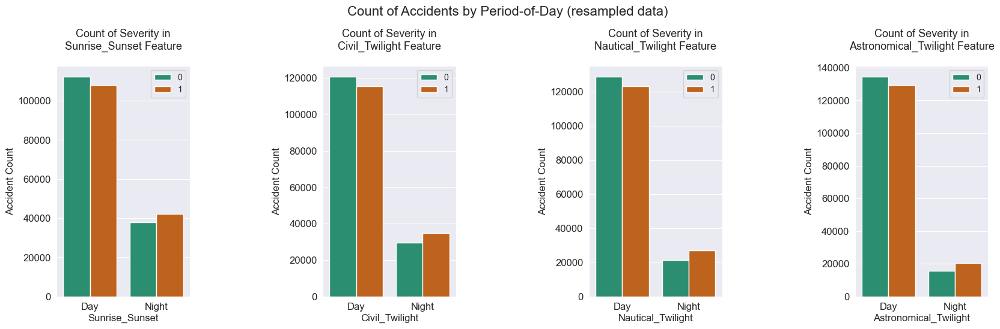

In [59]:
period_features = ['Sunrise_Sunset','Civil_Twilight','Nautical_Twilight','Astronomical_Twilight']

fig, axs = plt.subplots(ncols=1, nrows=4, figsize=(20, 5))

plt.subplots_adjust(wspace = 1)
for i, feature in enumerate(period_features, 1):    
    plt.subplot(1, 4, i)
    sns.countplot(x=feature, hue='High_Severity', data=df_bal ,palette="Dark2")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Accident Count', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(['0', '1'], loc='upper right', prop={'size': 10})
    plt.title('Count of Severity in\n{} Feature'.format(feature), size=13, y=1.05)
for ax in axs.flat:
    ax.axis('off')

fig.suptitle('Count of Accidents by Period-of-Day (resampled data)',y=1.08, fontsize=16)
plt.show()

More serious accidents at night despite low number of accidents

##### Hour

In [60]:
fig = px.histogram(df_bal, x='Hour', color='High_Severity', barmode='group',
                   title='Count of Accidents by Hour (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2)



fig.show()


More accidents during daytime peaks. Less but more severe accidents during night hours.

#### Address Features

##### TimeZone

In [61]:
fig = px.histogram(df_bal, x='Timezone', color='High_Severity', barmode='group',
                   title='Count of Accidents by Hour (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2)



fig.show()


Eastern Timezone is the most dangerous

##### State

In [62]:
fig = px.histogram(df_bal, x='State', color='High_Severity', barmode='group',
                   title='Count of Accidents by State (resampled data)',
                   color_discrete_sequence=px.colors.qualitative.Dark2).update_xaxes(categoryorder='total descending')



fig.show()

Most severe accidents occur in California, Texas and Florida.

##### Street

There are more and more studies found that higher speed limits were associated with an increased likelihood of crashes and deaths. And speed limits are highly related to street type. Street type hence can be a good predictor of serious accidents. There is no feature about street type in the original dataset though, we can extract it from the street name.

The top 40 most common words in street names were selected. This list contains not only street types but also some common words widely used in street names.

In [63]:
st_type =' '.join(df['Street'].unique().tolist()) # flat the array of street name
st_type = re.split(" |-", st_type) # split the long string by space and hyphen
st_type = [x[0] for x in Counter(st_type).most_common(40)] # select the 40 most common words
print('The 40 most common words:')
print(*st_type, sep = ", ") 

The 40 most common words:
Rd, St, Ave, Dr, N, S, E, W, Blvd, Ln, Highway, Pkwy, Hwy, Way, NE, State, SW, NW, US, Old, SE, I, Ct, Road, Pl, Creek, Route, Hill, Cir, Lake, Park, County, Fwy, Valley, Expy, Trl, Pike, Ridge, Mill, River


In [64]:
# Remove some irrelevant words and add spaces and hyphen back
st_type= [' Rd', ' St', ' Dr', ' Ave', ' Blvd', ' Ln', ' Highway', ' Pkwy', ' Hwy', 
          ' Way', ' Ct', 'Pl', ' Road', 'Creek', ' Cir',  'Route', 'Trl', 'Pike', ' Fwy', 'I-']
print(*st_type, sep = ", ")  

 Rd,  St,  Dr,  Ave,  Blvd,  Ln,  Highway,  Pkwy,  Hwy,  Way,  Ct, Pl,  Road, Creek,  Cir, Route, Trl, Pike,  Fwy, I-


In [65]:
for i in st_type:
  df[i.strip()] = np.where(df['Street'].str.contains(i, case=True, na = False), True, False)


In [66]:
df_bal = resample(df, 'High_Severity', 150000)

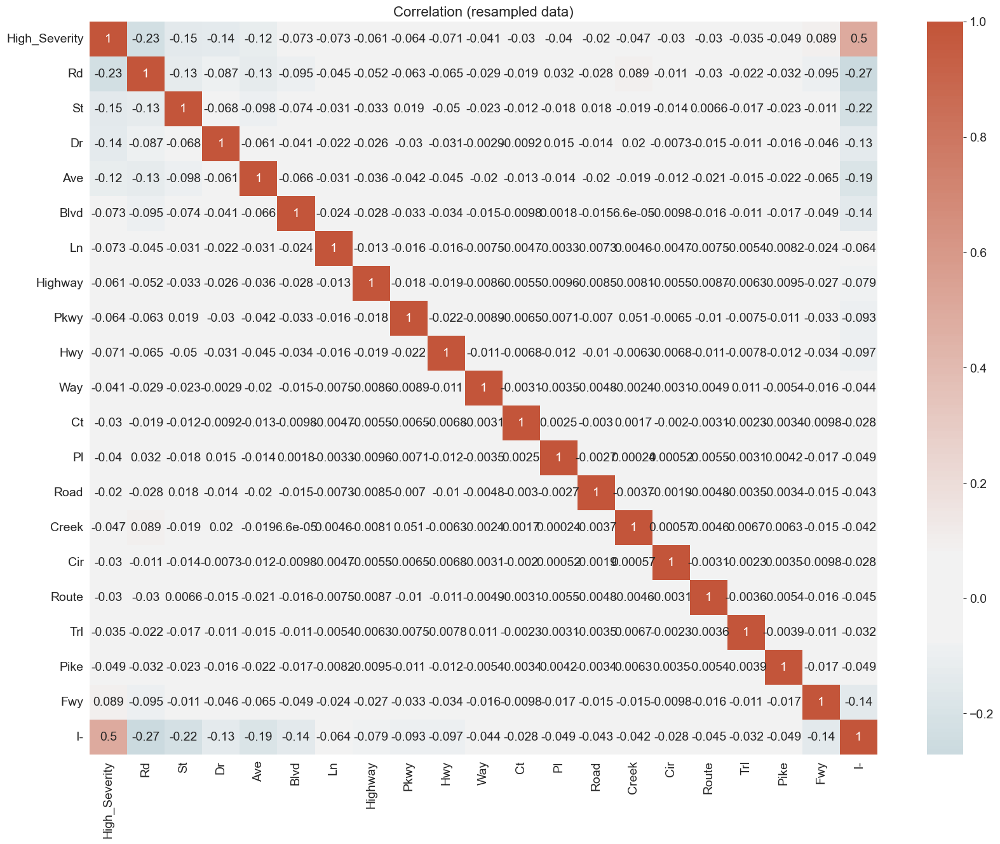

In [67]:
street_corr  = df_bal.loc[:,['High_Severity']+[x.strip() for x in st_type]].corr()
plt.figure(figsize=(20,15))
cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
sns.heatmap(street_corr, annot=True, cmap=cmap, center=0).set_title("Correlation (resampled data)", fontsize=16)
plt.show()

Interstate Highway is the most dangerous. Other roads turn out to be relatively safe.

In [68]:
# drop_list = street_corr.index[street_corr['High_Severity'].abs()<0.1].to_list()
# df = df.drop(drop_list, axis=1)

# resample again
df_bal = resample(df, 'High_Severity', 150000)

In [69]:
df_bal['Snow'].value_counts()

Snow
False    294840
True       5160
Name: count, dtype: int64

#### Weather Features

##### Continous Weather Features

Normalize features with extremely slewed distribution

In [70]:
from scipy.stats import boxcox

df['Pressure_bc']= boxcox(df['Pressure(in)'].apply(lambda x: x+1),lmbda=6)
df['Visibility_bc']= boxcox(df['Visibility(mi)'].apply(lambda x: x+1),lmbda = 0.1)
df['Wind_Speed_bc']= boxcox(df['Wind_Speed(mph)'].apply(lambda x: x+1),lmbda=-0.2)
df = df.drop(['Pressure(in)','Visibility(mi)','Wind_Speed(mph)'], axis=1)

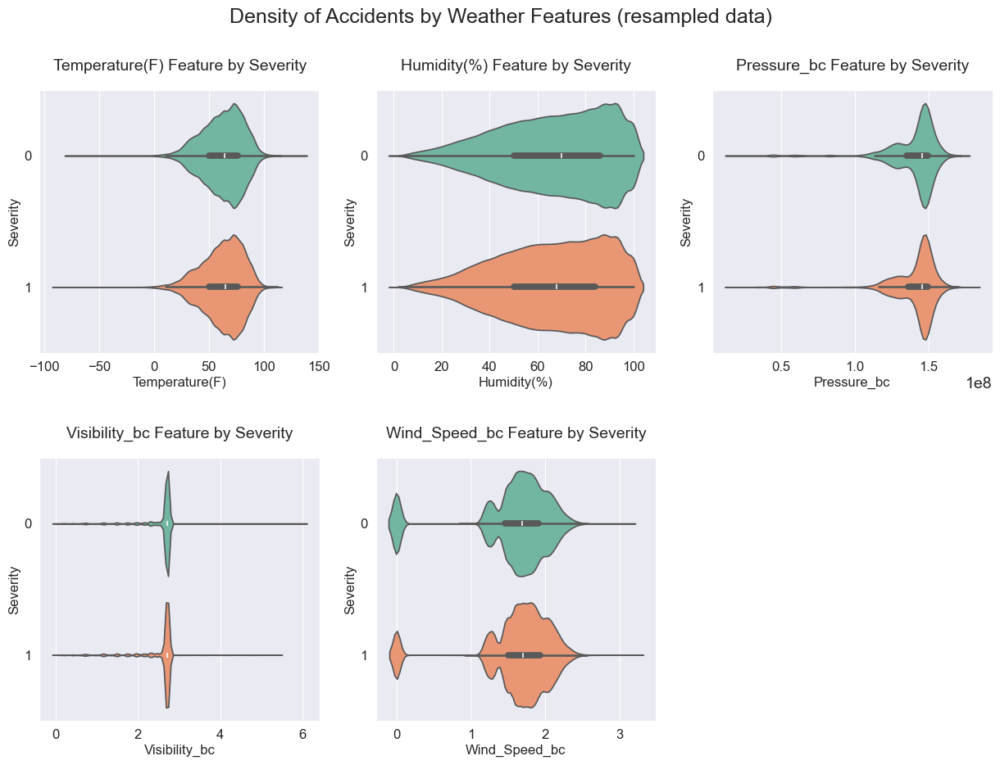

In [71]:
df_bal = resample(df, 'High_Severity', 150000)

df_bal['High_Severity'] = df_bal['High_Severity'].astype('category')
num_features = ['Temperature(F)', 'Humidity(%)', 'Pressure_bc', 'Visibility_bc', 'Wind_Speed_bc']
fig, axs = plt.subplots(ncols=2, nrows=3, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4,wspace = 0.2)
for i, feature in enumerate(num_features, 1):    
    plt.subplot(2, 3, i)
    sns.violinplot(x=feature, y="High_Severity", data=df_bal, palette="Set2")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Severity', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)

    plt.title('{} Feature by Severity'.format(feature), size=14, y=1.05)

for ax in axs.flat:
    ax.axis('off')
    
fig.suptitle('Density of Accidents by Weather Features (resampled data)', fontsize=18)
plt.show()

##### Weather Condition

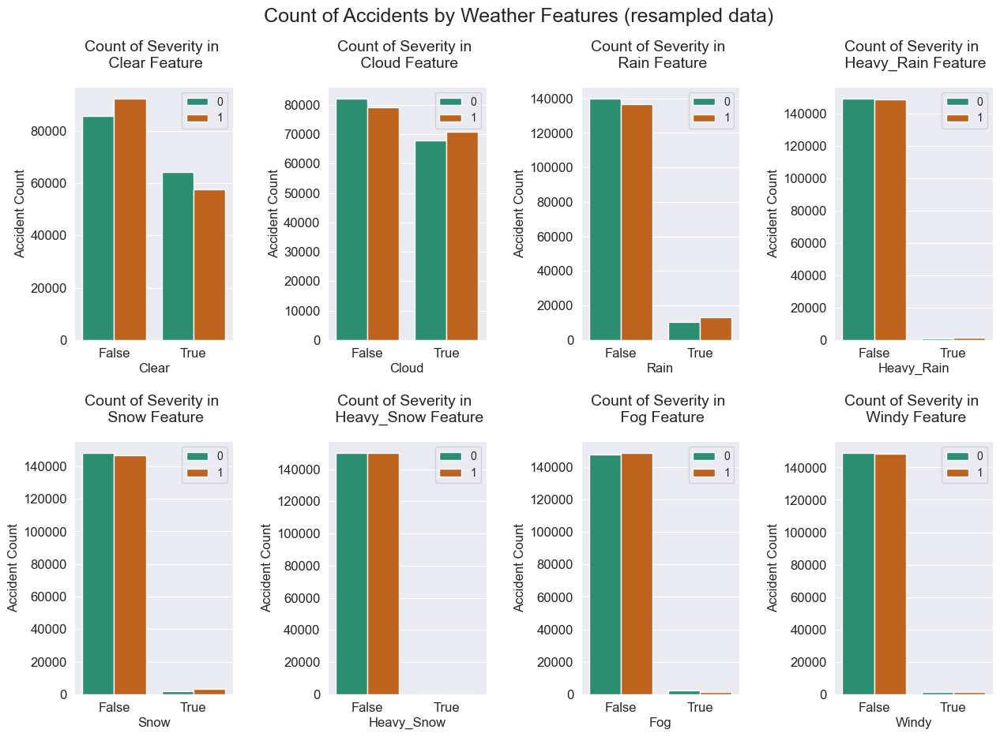

In [72]:
fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4,wspace = 0.6)
for i, feature in enumerate(weather, 1):    
    plt.subplot(2, 4, i)
    sns.countplot(x=feature, hue='High_Severity', data=df_bal ,palette="Dark2")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Accident Count', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(['0', '1'], loc='upper right', prop={'size': 10})
    plt.title('Count of Severity in \n {} Feature'.format(feature), size=14, y=1.05)

for ax in axs.flat:
    ax.axis('off')
fig.suptitle('Count of Accidents by Weather Features (resampled data)', fontsize=18)
plt.show()

As seen from above, accidents are little more likely to be serious during rain or snow while less likely on a cloudy day.

In [73]:
df.drop(columns=['Heavy_Snow', 'Heavy_Rain', 'Fog', 'Windy'], axis=1, inplace=True)

##### Wind Direction

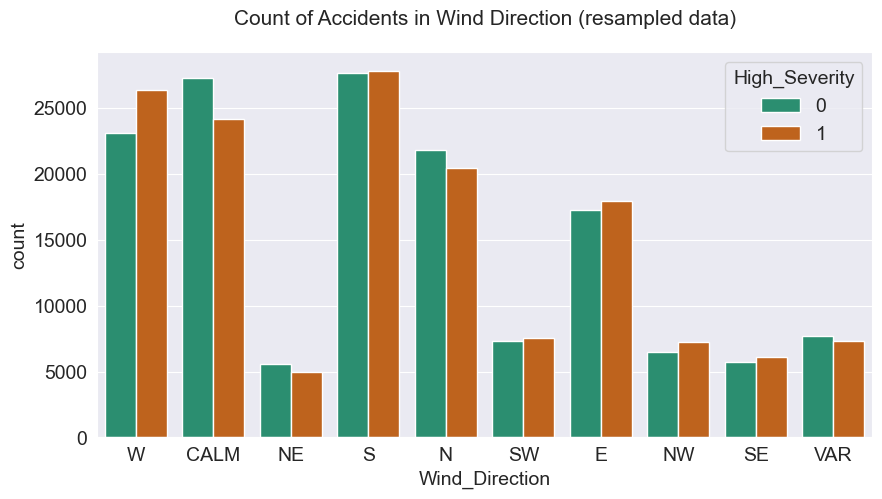

In [74]:
plt.figure(figsize=(10,5))
chart = sns.countplot(x='Wind_Direction', hue='High_Severity', data=df_bal ,palette="Dark2")
plt.title("Count of Accidents in Wind Direction (resampled data)", size=15, y=1.05)
plt.show()

In [75]:
df.drop(columns=['Wind_Direction'], inplace=True)

##### POI Features

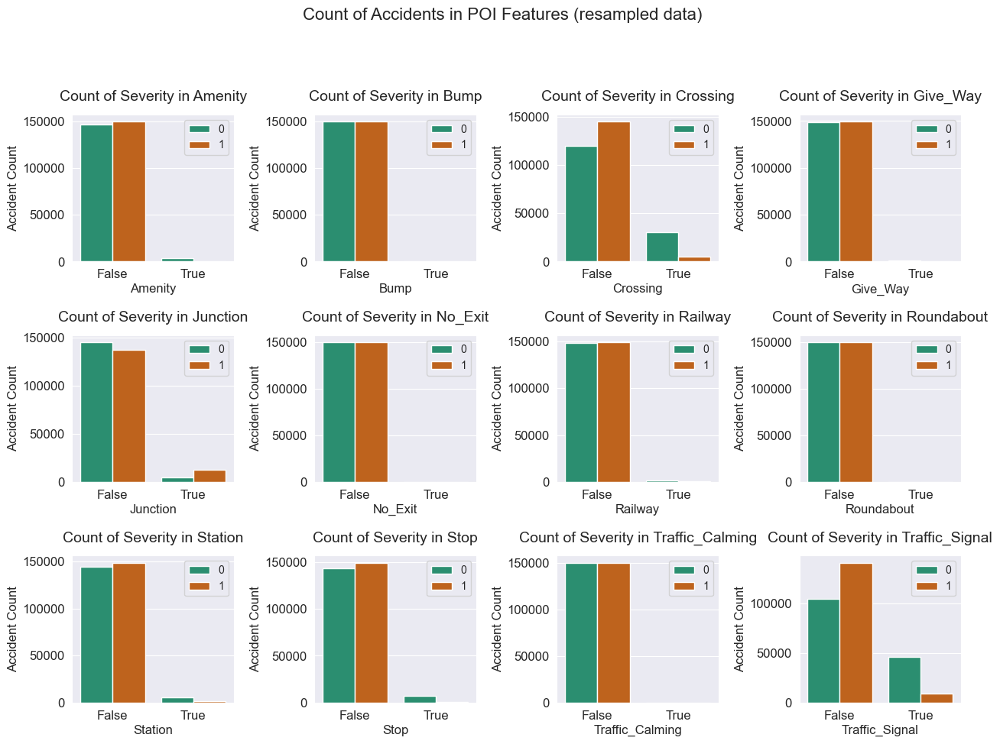

In [76]:
# df_bal = resample(df, 'High_Severity', 150000)

poi_features = [
 'Amenity',
 'Bump',
 'Crossing',
 'Give_Way',
 'Junction',
 'No_Exit',
 'Railway',
 'Roundabout',
 'Station',
 'Stop',
 'Traffic_Calming',
 'Traffic_Signal']

fig, axs = plt.subplots(ncols=3, nrows=4, figsize=(15, 10))

plt.subplots_adjust(hspace=0.5,wspace = 0.5)
for i, feature in enumerate(poi_features, 1):    
    plt.subplot(3, 4, i)
    sns.countplot(x=feature, hue='High_Severity', data=df_bal ,palette="Dark2")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Accident Count', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(['0', '1'], loc='upper right', prop={'size': 10})
    plt.title('Count of Severity in {}'.format(feature), size=14, y=1.05)

for ax in axs.flat:
    ax.axis('off')

fig.suptitle('Count of Accidents in POI Features (resampled data)',y=1.02, fontsize=16)
plt.show()


Accidents are more likely to be severe if they occur close to a junction

In [77]:
#df= df.drop(['Amenity','Bump','Give_Way','No_Exit','Roundabout','Traffic_Calming'], axis=1)
df.drop(columns=['Street', 'City', 'County', 'Zipcode', 'Airport_Code','State'], inplace=True)

In [78]:
df.drop('Weather_Timestamp', axis=1, inplace=True)

#### Correlation 

In [79]:
df.columns

Index(['Severity', 'Start_Time', 'Start_Lat', 'Start_Lng', 'Timezone',
       'Temperature(F)', 'Humidity(%)', 'Precipitation(in)', 'Amenity', 'Bump',
       'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout',
       'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight', 'Clear', 'Cloud', 'Rain', 'Snow', 'Year',
       'Month', 'Weekday', 'Day', 'Hour', 'Minute', 'High_Severity', 'Rd',
       'St', 'Dr', 'Ave', 'Blvd', 'Ln', 'Highway', 'Pkwy', 'Hwy', 'Way', 'Ct',
       'Pl', 'Road', 'Creek', 'Cir', 'Route', 'Trl', 'Pike', 'Fwy', 'I-',
       'Pressure_bc', 'Visibility_bc', 'Wind_Speed_bc'],
      dtype='object')

In [80]:
df.dtypes

Severity                          int64
Start_Time               datetime64[ns]
Start_Lat                       float64
Start_Lng                       float64
Timezone                         object
Temperature(F)                  float64
Humidity(%)                     float64
Precipitation(in)               float64
Amenity                            bool
Bump                               bool
Crossing                           bool
Give_Way                           bool
Junction                           bool
No_Exit                            bool
Railway                            bool
Roundabout                         bool
Station                            bool
Stop                               bool
Traffic_Calming                    bool
Traffic_Signal                     bool
Sunrise_Sunset                   object
Civil_Twilight                   object
Nautical_Twilight                object
Astronomical_Twilight            object
Clear                            object


In [81]:
categories = ['Clear', 'Cloud', 'Rain', 'Snow', 'Sunrise_Sunset', 'Civil_Twilight',
       'Nautical_Twilight', 'Astronomical_Twilight', 'Timezone']

In [82]:
# one-hot encode

df = pd.get_dummies(df, columns=categories, drop_first=True)

In [83]:
df.drop('Severity', axis=1, inplace=True)

In [84]:
df_bal = resample(df, 'High_Severity', 150000)

In [85]:
#plot correlation
corr = df_bal.corr()
target_corr = corr['High_Severity']
strong_corr = target_corr[(target_corr.abs() > 0.05)].index.to_list()
strong_corr.remove('High_Severity')
strong_corr



['Start_Lat',
 'Amenity',
 'Crossing',
 'Junction',
 'Station',
 'Stop',
 'Traffic_Signal',
 'Weekday',
 'Hour',
 'Minute',
 'Rd',
 'St',
 'Dr',
 'Ave',
 'Blvd',
 'Ln',
 'Highway',
 'Pkwy',
 'Hwy',
 'Fwy',
 'I-',
 'Wind_Speed_bc',
 'Astronomical_Twilight_Night',
 'Timezone_US/Pacific']

In [86]:
new_df = df[['High_Severity'] + strong_corr].copy()
new_df.head()

,High_Severity,Start_Lat,Amenity,Crossing,Junction,Station,Stop,Traffic_Signal,Weekday,Hour,Minute,Rd,St,Dr,Ave,Blvd,Ln,Highway,Pkwy,Hwy,Fwy,I-,Wind_Speed_bc,Astronomical_Twilight_Night,Timezone_US/Pacific
0,0,39.93,False,False,False,False,False,False,0,6,367.00,True,False,False,False,False,False,False,False,False,False,False,1.86,False,False
1,1,40.10,False,False,False,False,False,False,0,8,490.00,True,False,False,False,False,False,False,False,False,False,False,1.46,False,False
2,0,39.79,False,False,False,False,False,False,0,9,575.00,False,False,False,True,False,False,False,False,False,False,False,1.69,False,False
3,1,40.02,False,False,False,False,False,False,0,12,720.00,False,False,False,False,False,False,False,False,False,True,False,1.59,False,False
4,0,39.73,False,False,False,False,False,True,0,12,772.00,False,False,False,True,False,False,False,False,False,False,False,1.86,False,False


In [87]:
df_bal = resample(new_df, 'High_Severity', 150000)

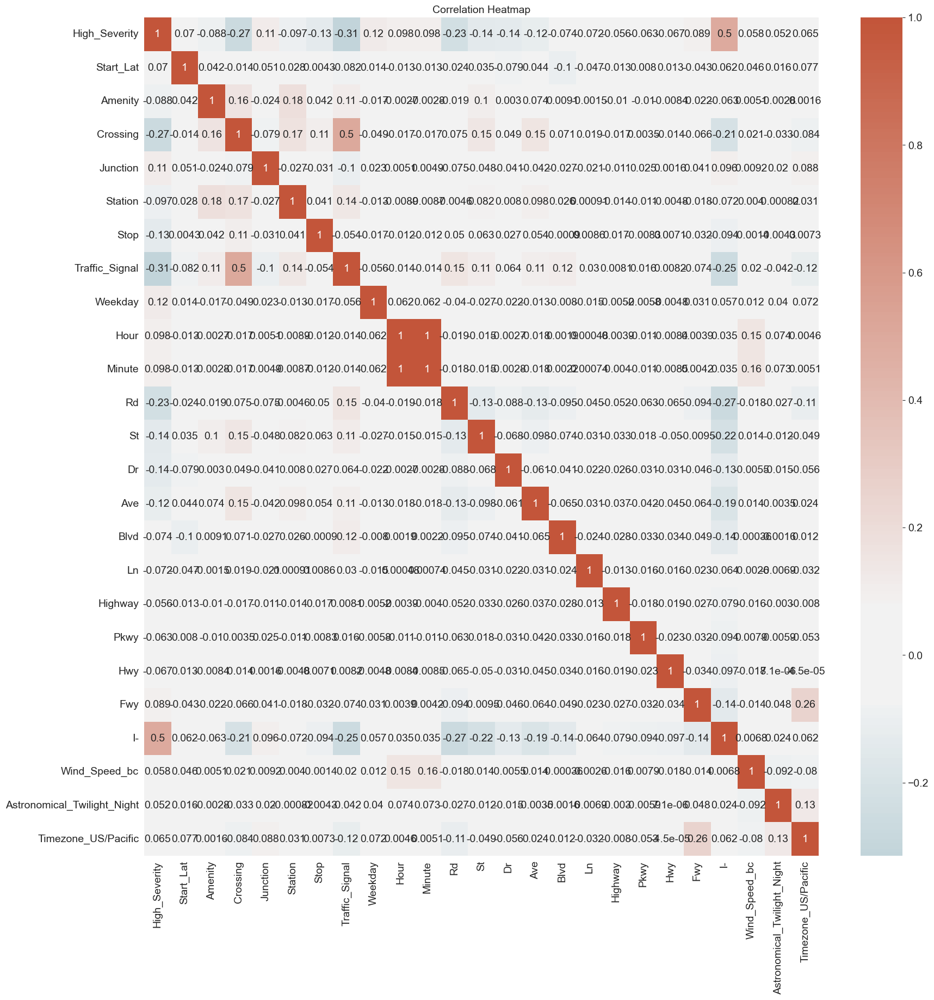

In [88]:
plt.figure(figsize=(20,20))
cmap = sns.diverging_palette(220, 20, sep=20, as_cmap=True)
sns.heatmap(df_bal.corr(), annot=True,cmap=cmap, center=0).set_title("Correlation Heatmap", fontsize=14)
plt.show()

In [89]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 324233 entries, 0 to 339765
Data columns (total 25 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   High_Severity                324233 non-null  int64  
 1   Start_Lat                    324233 non-null  float64
 2   Amenity                      324233 non-null  bool   
 3   Crossing                     324233 non-null  bool   
 4   Junction                     324233 non-null  bool   
 5   Station                      324233 non-null  bool   
 6   Stop                         324233 non-null  bool   
 7   Traffic_Signal               324233 non-null  bool   
 8   Weekday                      324233 non-null  int32  
 9   Hour                         324233 non-null  int32  
 10  Minute                       324233 non-null  float64
 11  Rd                           324233 non-null  bool   
 12  St                           324233 non-null  bool   
 13  Dr  

### Training the model

#### Training and Test Sets

In [90]:
X=new_df.drop(['High_Severity'], axis=1)
y=new_df['High_Severity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

In [91]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 226963 entries, 288741 to 315153
Data columns (total 24 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Start_Lat                    226963 non-null  float64
 1   Amenity                      226963 non-null  bool   
 2   Crossing                     226963 non-null  bool   
 3   Junction                     226963 non-null  bool   
 4   Station                      226963 non-null  bool   
 5   Stop                         226963 non-null  bool   
 6   Traffic_Signal               226963 non-null  bool   
 7   Weekday                      226963 non-null  int32  
 8   Hour                         226963 non-null  int32  
 9   Minute                       226963 non-null  float64
 10  Rd                           226963 non-null  bool   
 11  St                           226963 non-null  bool   
 12  Dr                           226963 non-null  bool   
 13 

In [92]:
#scaling numeric features
numeric_cols = X_train.select_dtypes(include=['number']).columns.tolist()

scaler = MinMaxScaler() 
scaled = scaler.fit_transform(X_train[numeric_cols])
scaled_test = scaler.transform(X_test[numeric_cols])

X_train[numeric_cols] = scaled
X_test[numeric_cols] = scaled_test

#### Model

We will use LIGHTGBM model to do the classification

In [153]:
# lightgbm

train_data = lgb.Dataset(X_train, label=y_train) 
test_data = lgb.Dataset(X_test, label=y_test, reference=train_data) 
  
# Define hyperparameters and objective for LightGBM 
params = { 
    'objective': 'binary', 
    'metric': 'auc', 
    'boosting_type': 'gbdt', 
    'num_leaves': 31, 
    'learning_rate': 0.4, 
    'feature_fraction': 0.9, 
} 

num_round = 100
  
# Training the model using defined parameters, training data, and specified number of rounds 
model = lgb.train(params, train_data, 
                  num_boost_round=num_round, valid_sets=[test_data], callbacks=[lgb.early_stopping(stopping_rounds=15)]) 



y_pred = model.predict(X_train)
y_test_pred =model.predict(X_test)
y_test_pred_binary = [1 if prob > 0.5 else 0 for prob in y_test_pred]

# print(len(y_test))
# print(len(y_test_pred_binary))

accuracy = accuracy_score(y_test, y_test_pred_binary)
report = classification_report(y_test, y_test_pred_binary)
train_roc_auc = ras(y_train, y_pred)
test_roc_auc = ras(y_test, y_test_pred)

print(f"Training ROC-AUC: {train_roc_auc:.2f}") 
print(f"Test ROC-AUC: {test_roc_auc:.2f}") 
print(f'Accuracy: {accuracy:.2f}')
print(report)

[LightGBM] [Info] Number of positive: 76420, number of negative: 150543
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.188412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 226963, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.336707 -> initscore=-0.678004
[LightGBM] [Info] Start training from score -0.678004
Training until validation scores don't improve for 15 rounds
Did not meet early stopping. Best iteration is:
[99]	valid_0's auc: 0.894313
Training ROC-AUC: 0.91
Test ROC-AUC: 0.89
Accuracy: 0.83
              precision    recall  f1-score   support

           0       0.86      0.89      0.88     64690
           1       0.77      0.70      0.73     32580

    accuracy                           0.83     97270
   macro avg       0.81     

In [154]:
joblib.dump(model, 'classifier.joblib')

['classifier.joblib']